# Starting Code

In [1]:
# Help with Training data extract from:
# https://towardsdatascience.com/email-spam-detection-1-2-b0e06a5c0472

import numpy as np
import email
import os 
import glob

path = ''

# Get email contents 
easy_ham_paths = glob.glob(path+'easy_ham/*')
easy_ham_2_paths =  glob.glob(path+'easy_ham_2/*')
hard_ham_paths =  glob.glob(path+'hard_ham/*')

spam_paths = glob.glob(path+'spam/*')
spam_2_paths = glob.glob(path+'spam_2/*')

def get_email_content(email_path):
    file = open(email_path, encoding='latin1')
    try:
        msg = email.message_from_file(file)
        for part in msg.walk():
            if part.get_content_type() == 'text/plain':
                return part.get_payload() # raw text print
    except Exception as e:
        print(e)
        
def get_email_content_bulk(email_paths):
    email_contents = []
    
    for o in email_paths:
        email_contents.append(get_email_content(o))
    return email_contents

spam_2_paths

['spam_2/01320.9d28c111c72720b5cd64a025591dbce5',
 'spam_2/00753.c3032ff8329006ec6b39b6c821185b1c',
 'spam_2/00817.446795af3e79a13e7c3aa784573bcaa0',
 'spam_2/00016.4fb07c8dff1a5a2b4889dc5024c55023',
 'spam_2/00143.95e60a4160434f341761931c65844a38',
 'spam_2/00889.272969152a8ce2d6ece155571e862683',
 'spam_2/01297.6899dd73603e94dcefaba9970c3cfb69',
 'spam_2/00199.3536ffa9d7e1b912f6fc649d779cfe5d',
 'spam_2/00035.bd7183c238b884a153ad4888fbee9bf6',
 'spam_2/01067.cbfadba14efd2125f98bf8ae03c68f68',
 'spam_2/00357.049b1dd678979ce56f10dfa9632127a3',
 'spam_2/00756.b68f9bcfd782a01a2ece132eccdcbbe9',
 'spam_2/00511.7a9009733666ca7ab0325e44e17bf584',
 'spam_2/00079.7a1b9cd54acec8774ef833df17206630',
 'spam_2/01024.5b32720b2ad57ee16bd959a5cf58f575',
 'spam_2/00849.a1bd18d80b0531de33b9e83cd14f79f2',
 'spam_2/00554.c325ab7400fb7e3f053ed0cac4ed7545',
 'spam_2/00250.ae302eda2386979f6ac6bfff9e9f7137',
 'spam_2/00216.c07de35b7e7f659e3c0c071b30053afa',
 'spam_2/00998.92da52a65a4d039a6b9c02b0d65a1bbf',


# Split Training/Testing Data

In [2]:
from sklearn.model_selection import train_test_split

ham_path = [ easy_ham_paths, easy_ham_2_paths, hard_ham_paths]
spam_path = [spam_paths, spam_2_paths]

# split ham data
ham_sample = np.array([train_test_split(o) for o in ham_path],dtype=object)

ham_train = np.array([])
ham_test =  np.array([])
for o in ham_sample:
    ham_train = np.concatenate((ham_train, o[0]),axis=0)
    ham_test = np.concatenate((ham_test,o[1]), axis=0)
ham_train.shape, ham_test.shape;
                               

In [3]:
# Split spam data
spam_sample = np.array([train_test_split(o) for o in spam_path],dtype=object)
spam_train = np.array([])
spam_test = np.array([])
for o in spam_sample:
    spam_train = np.concatenate((spam_train, o[0]), axis=0)
    spam_test = np.concatenate((spam_test, o[1]), axis=0)
spam_train.shape, spam_test.shape

((1422,), (475,))

In [4]:
# Shuffle index
ham_train_label = [0]*ham_train.shape[0]
spam_train_label = [1]*spam_train.shape[0]
x_train = np.concatenate((ham_train, spam_train))
y_train = np.concatenate((ham_train_label, spam_train_label))

ham_test_label = [0]*ham_test.shape[0]
spam_test_label =  [1]*spam_test.shape[0]
x_test = np.concatenate((ham_test, spam_test))
y_test = np.concatenate((ham_test_label, spam_test_label))

train_shuffle_index = np.random.permutation(np.arange(0,x_train.shape[0]))
test_shuffle_index = np.random.permutation(np.arange(0,x_test.shape[0]))

# Note: Null values - to remove
x_train = x_train[train_shuffle_index]
y_train = y_train[train_shuffle_index]


x_test = x_test[test_shuffle_index]
y_test = y_test[test_shuffle_index]

x_train =  get_email_content_bulk(x_train)
x_test = get_email_content_bulk(x_test)

def remove_null(datas, labels):
    not_null_idx = [i for i,o in enumerate(datas) if o is not None]
    return np.array(datas)[not_null_idx], np.array(labels)[not_null_idx]

x_train, y_train = remove_null(x_train, y_train)
x_test, y_test = remove_null(x_test, y_test)

x_test, y_test


(array(['> Now for Benjamin, yea id love to have something like the amazingly cool\n> Fisher Price My First (cd, casset, vasectomy, dirtybomb) products. Perhaps\n> the My First Cd might work...time to let ebay do the walking.\n\nSony makes such a line of products.\n\nMy father was legendary for his abilty to break things.  His \'thumbs of death\'\nwould rival anything a toddler could do to devices.  After countless numbers of\nWalkman devices having their lids broken or buttons pressed into oblivion I\nfound the Sony devices.  I got him a "My First Sony" (be afraid of the\nmarketing) CD player.   It was /fire engine red/ but was completely\nindestructible.  I hacked a headphone jack into it and gave it to him.  He\ncomplained of it\'s looks but used it nonetheless.  I also gave him a pack of\nheadphones as there\'s no such things indestuctible headphones that aren\'t\nobscenely bulky.\n\nNow that we\'re riding up the curve of an ever increasing geezer population, how\nsoon before devic

# Preprocessing

## Process Sentence

### Clean Up (Part 1)

In [5]:
import re 
import string
from nltk.tokenize import word_tokenize

def remove_hyperlink(word):
    return re.sub(r"htt\S+", "", word)

def to_lower(word):
    return word.lower()

def remove_number(word):
    return re.sub(r"\d+", "", word)

def remove_punc(word):
    result = word.translate(str.maketrans(dict.fromkeys(string.punctuation.replace('!',""))))
    return result

def remove_whitespace(word):
    result = word.strip()
    return result

def replace_newline(word):
    return word.replace("\n", "")

def clean_up_pipeline(sentence):
    cleaning_utils = [remove_hyperlink, replace_newline, to_lower, remove_number, remove_punc, remove_whitespace]
    for o in cleaning_utils:
        sentence = o(sentence)
        
    return sentence
    

    

In [6]:
x_train = [clean_up_pipeline(o) for o in x_train]
x_test = [clean_up_pipeline(o) for o in x_test]

### Clean Up (Part 2)

In [7]:
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer

stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()


/home/chi/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.feature_extraction.stop_words module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_extraction.text. Anything that cannot be imported from sklearn.feature_extraction.text is now part of the private API.
  warnings.warn(message, FutureWarning)


In [8]:
# Tokenization - long process (Error?)
x_train = [word_tokenize(o) for o in x_train]
x_test = [word_tokenize(o) for o in x_test]


In [9]:
x_train
x_test

[['now',
  'for',
  'benjamin',
  'yea',
  'id',
  'love',
  'to',
  'have',
  'something',
  'like',
  'the',
  'amazingly',
  'cool',
  'fisher',
  'price',
  'my',
  'first',
  'cd',
  'casset',
  'vasectomy',
  'dirtybomb',
  'products',
  'perhaps',
  'the',
  'my',
  'first',
  'cd',
  'might',
  'worktime',
  'to',
  'let',
  'ebay',
  'do',
  'the',
  'walkingsony',
  'makes',
  'such',
  'a',
  'line',
  'of',
  'productsmy',
  'father',
  'was',
  'legendary',
  'for',
  'his',
  'abilty',
  'to',
  'break',
  'things',
  'his',
  'thumbs',
  'of',
  'deathwould',
  'rival',
  'anything',
  'a',
  'toddler',
  'could',
  'do',
  'to',
  'devices',
  'after',
  'countless',
  'numbers',
  'ofwalkman',
  'devices',
  'having',
  'their',
  'lids',
  'broken',
  'or',
  'buttons',
  'pressed',
  'into',
  'oblivion',
  'ifound',
  'the',
  'sony',
  'devices',
  'i',
  'got',
  'him',
  'a',
  'my',
  'first',
  'sony',
  'be',
  'afraid',
  'of',
  'themarketing',
  'cd',
  'pl

In [10]:
# stopwords: a, about, above, down, doing , the
# - Occurs VERY OFTEN so do not want to count that is "spanm or non-spam " words since they re neutral words
def remove_stop_words(words):
    result = [i for i in words if i not in ENGLISH_STOP_WORDS]
    return result

#Ex:dirty_text = "He studies in the house yesterday, unluckily, the fans breaks down"

# Stemming - remove prefix and suffix
# Form 	Suffix 	Stem
# running 	-ing 	run
# runs 	-s 	run
# consolidate 	-ate 	consolid
# consolidated 	-ated 	consolid

# eX:
# clean_text = word_stemmer(dirty_text.split(" "))
# clean_text
#Output
# 'He studi in the hous yesterday, unluckily, the fan break down'
def  word_stemmer(words):
    return [stemmer.stem(o) for o in words]

#Lemmatizer - convert words back to base from (per dictionary)
# Form 	Morphological Information 	Lemma
# studies 	Present tense of the word study 	study
# ran 	Past tense of the word run 	run

# EX: clean_text = word_lemmatizer(dirty_text.split(" "))
#clean_text
#Output
# 'I study in the house yesterday, unluckily, the fan break down'
def word_lemmatizer(words):
    return [lemmatizer.lemmatize(o) for o in words]

def clean_token_pipeline(words):
    cleaning_utils = [remove_stop_words, word_lemmatizer]
    
    for o in cleaning_utils:
        words = o(words)
    return words


    
    

In [11]:
x_train = [clean_token_pipeline(o) for o in x_train]
x_test = [clean_token_pipeline(o) for o in x_test]

x_train = [" ".join(o) for o in x_train]
x_test = [" ".join(o) for o in x_test]

In [12]:
x_train, x_test

(['like irssiorg aptrpm repository snapshot irssirpm irssirpmsrc irssirpmlist mailing list rpmlistfreshrpmsnet',
  'url date suppliedrings distant star betray small rocky planet say astronomer suggesting census soon possible',
  'monday august tom wrote post mg s colums k dewdney dug bunch book called turing omnibus course goodens dougy hoffstadlerak dewdney looking column computer recreation turn he ontario homemade scifi onlinevat manprogramming rogerthe homunculidsalphie omegaross',
  'fri aug tom wrote talk far little action department justice say ready file criminal lawsuit individual distribute receive unauthorized copyrighted material internetand creating public domain content thereeven person begin talk acomplete hypocrite open source people talk thegpl aint close know talkif creator didnt say paying theft sosimple hell thats major holy booksfair use need clarified bit hope start lockingpeople hope finding job working someonethat make thing people supposed drumroll pay adam l d

# Visualization

## Wordcloud

In [13]:
from wordcloud import WordCloud, STOPWORDS # conda install -c conda-forge wordcloud, pip install wordcloud, https://pypi.org/project/wordcloud/


import matplotlib.pyplot as plt

def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), title=None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'one', 'br', 'Po', 'th', 'sayi', 'fo', 'Unknown'}
    stopwords = stopwords.union(more_stopwords)
    
    wordcloud = WordCloud(background_color='black',stopwords = stopwords,
                         max_words=max_words, max_font_size=max_font_size,
                          random_state=42, width=800,height=400,mask=mask)
    wordcloud.generate(str(text))
    
    plt.figure(figsize=figure_size)
    
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear');
        plt.title(title, fontdict={'size': title_size, 'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title,fontdict={'size':title_size,'color':'black', 'verticalalignment':'bottom'})
    plt.axis('off');
    plt.tight_layout()
    
                   

In [14]:
spam_train_index = [i for i,o in enumerate(y_train) if o == 1]
non_spam_train_index = [i for i,o in enumerate(y_train) if o == 0] # ham

spam_email = np.array(x_train)[spam_train_index]
non_spam_email = np.array(x_train)[non_spam_train_index]


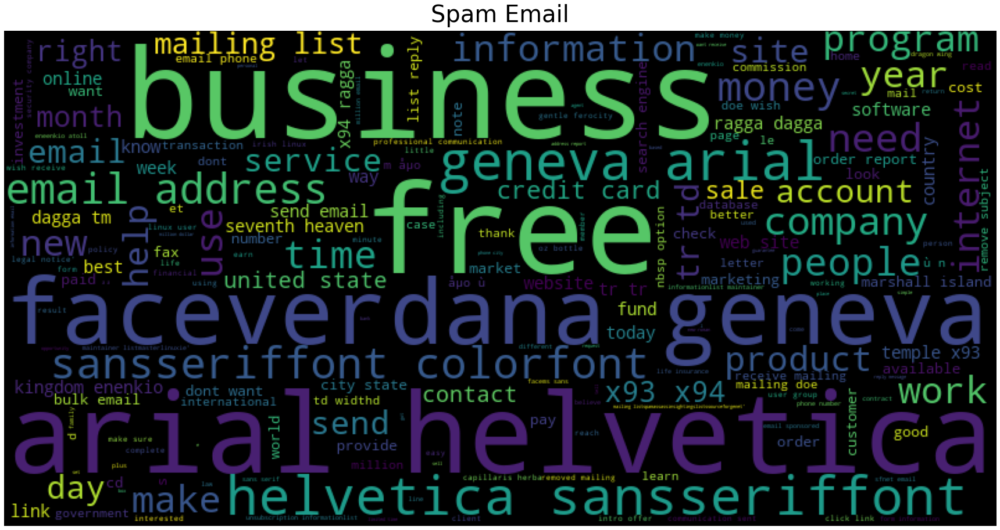

In [15]:
plot_wordcloud(spam_email, title='Spam Email')

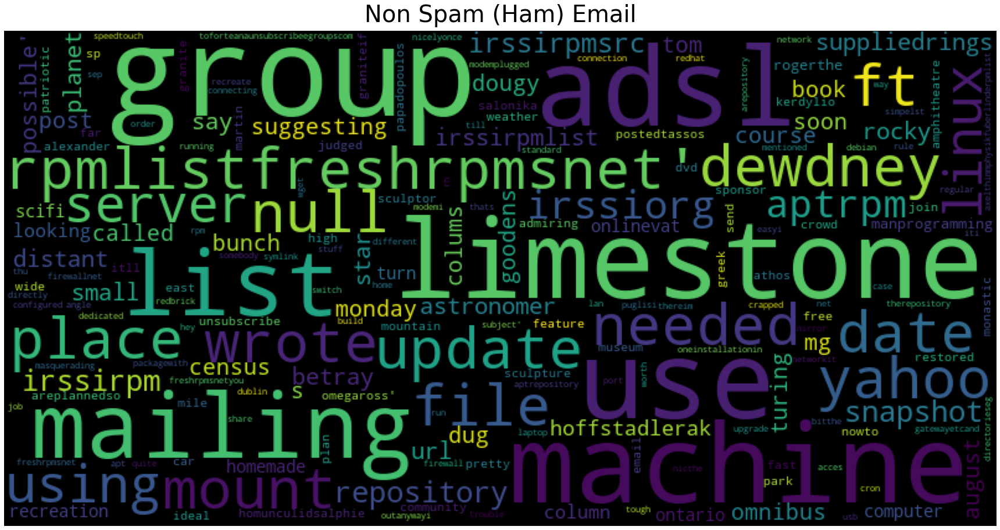

In [16]:
plot_wordcloud(non_spam_email, title='Non Spam (Ham) Email')

In [17]:
STOPWORDS

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 

In [18]:
spam_email

array(['wish unsubscribe list send email removenoucecom remove subject line write nouce nd ave n st petersburg fl ddddddddddddddddddddddddddddddddddddddddddddddddlowest mortgage rate americaeasy online form minute completedddddddddddddddddddddddddfor information rate low dont miss opportunity good bad credit ideal time purchase home refinance existing mortgage lower current payment convert adjustable rate mortgage arm low fixed loan convert arm better arm convert yr mortgage yr mortgage build equity faster need cash home equity loan rate priced right save hundred dollar month rate great dont miss opportunity information',
       'january st european country beganusing new euro somany country powerful economy unitedto use single currency piece historynow like send free euroand free report world currency just visitour site request euro euro report addition currency report receiveour free investment package learn option leverage ineuro currency mean small movement markethas huge profit po

In [19]:
x_test


['benjamin yea id love like amazingly cool fisher price cd casset vasectomy dirtybomb product cd worktime let ebay walkingsony make line productsmy father legendary abilty break thing thumb deathwould rival toddler device countless number ofwalkman device having lid broken button pressed oblivion ifound sony device got sony afraid themarketing cd player engine red completelyindestructible hacked headphone jack gave hecomplained look used nonetheless gave pack ofheadphones there thing indestuctible headphone arentobscenely bulkynow riding curve increasing geezer population howsoon device maker wise morbid marketingbe sony duck runsbill kearney',
 'mark derricutt wrote mind cron thing doing rpm qf fine wednesday february mark derricutt marktalioscom wrote fetched kb m b error exclusive lock varlibrpmpackages error open package index using db operation permitted e open rpm databasecannot open package index using db operation permitted rpm rebuilddb toorpmlist mailing list rpmlistfreshrpms

In [20]:
# import pandas as pd

# DF = pd.DataFrame(x_test)
# DF.to_csv('x_test.csv')

In [21]:
# DF = pd.DataFrame(x_train)
# DF.to_csv('x_train.csv')

# DF = pd.DataFrame(y_train)
# DF.to_csv('y_train.csv')

# DF = pd.DataFrame(y_test)
# DF.to_csv('y_test.csv')

# DF = pd.DataFrame(spam_train_index)
# DF.to_csv('spam_train_index.csv')

# DF = pd.DataFrame(non_spam_train_index)
# DF.to_csv('non_spam_train_index.csv')

# DF = pd.DataFrame(spam_email)
# DF.to_csv('spam_email.csv')

# spam_train_index
# spam_email

# DF = pd.DataFrame(non_spam_email)
# DF.to_csv('non_spam_email.csv')

# stopwords = set(STOPWORDS)
# more_stopwords = {'one', 'br', 'Po', 'th', 'sayi', 'fo', 'Unknown'}
# stopwords = stopwords.union(more_stopwords)
# DF = pd.DataFrame(stopwords)
# DF.to_csv('stopwords.csv')

## N-grams model visualization

In [22]:
from collections import defaultdict
import pandas as pd
import plotly as pl
import plotly.graph_objs as go # $ conda install -c plotly plotly=4.14.3, pip install plotly==4.14.3
from plotly import tools
import plotly.offline as py
py.init_notebook_mode(connected=True)


In [23]:
# ngram generation function
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram) ])
    return [" ".join(ngram) for ngram in ngrams]

# horizaton bar chart functiababsabsabsson
def horizational_bar_chart(df, color):
    trace = go.Bar(y=df['word'].values[::-1],
    x=df['wordcount'].values[::-1],
    showlegend=False,
    orientation='h',
    marker=dict(color=color,),)
    return trace

def visualize_in_bar_chart(word_count=1):
    # get bar charts from sincere quest (non-spam/ham?)
    freq_dict = defaultdict(int)
    for sent in non_spam_email:
        for word in generate_ngrams(sent, word_count):
            freq_dict[word] += 1
    fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
    fd_sorted.columns=['word', 'wordcount']
    trace0 = horizational_bar_chart(fd_sorted.head(20), 'blue')
    
    # get bar chart for insen quest (spam)
    freq_dict = defaultdict(int)
    for sent in spam_email:
        for word in generate_ngrams(sent, word_count):
            freq_dict[word] += 1
    fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
    fd_sorted.columns=['word', 'wordcount']
    trace1 = horizational_bar_chart(fd_sorted.head(20), 'blue')
    
    # create twabso subplabsabsots
#     fig = tools.make_subplots(rows=1, cols=2, vertical_spacing=0.04, subplot_titles=['freq words (non spam emails)','freq words (spam emails)']) # decrep.
    fig = pl.subplots.make_subplots(rows=1, cols=2, vertical_spacing=0.04, subplot_titles=['freq words (non spam emails)','freq words (spam emails)'])
    fig.append_trace(trace0,1,1)
    fig.append_trace(trace1,1,2)
    fig['layout'].update(height=600, width=800, paper_bgcolor='rgb(255,255,255)', title='Word count plots')
    py.iplot(fig,filename='word-plots')
    
    

In [24]:
visualize_in_bar_chart(1)

In [25]:
visualize_in_bar_chart(2)

# Target Distribution

In [26]:
from plotly import tools
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [27]:
# recode?
spam_train_index = [i for i,o in enumerate(y_train) if o ==1]
non_spam_train_index = [i for i ,o in enumerate(y_train) if o == 0]

# Training
spam_size = len(spam_train_index)
non_spam_size = len(non_spam_train_index)
total_train_size = spam_size + non_spam_size

trace= go.Bar(x=['spam', 'non-spam'], 
              y =[spam_size, non_spam_size], 
              marker=dict(color=[spam_size, non_spam_size], 
                          colorscale='Picnic',
                          reversescale=True),)
layout = go.Layout(title='Target Count for training data', font=dict(size=18))
data=[trace]
fig=go.Figure(data=data, layout=layout)
py.iplot(fig,filename='Target Count')

# target distrib 
labels=(np.array(['spam', 'non-spam']))
sizes = (np.array(([spam_size,non_spam_size]))/total_train_size*100)

trace = go.Pie(labels=labels,values=sizes)
layout = go.Layout(title='Training data Distrib', font=dict(size=18),width=600, height=600,)

data=[trace]
fig=go.Figure(data=data, layout=layout)
py.iplot(fig,filename='usertype')



In [28]:
# recode?
spam_test_index = [i for i,o in enumerate(y_test) if o ==1]
non_spam_test_index = [i for i ,o in enumerate(y_test) if o == 0]

# Testing
spam_size = len(spam_test_index)
non_spam_size = len(non_spam_test_index)
total_test_size = spam_size + non_spam_size

trace= go.Bar(x=['spam', 'non-spam'], 
              y =[spam_size, non_spam_size], 
              marker=dict(color=[spam_size, non_spam_size], 
                          colorscale='Picnic',
                          reversescale=True),)
layout = go.Layout(title='Target Count for test data', font=dict(size=18))
data=[trace]
fig=go.Figure(data=data, layout=layout)
py.iplot(fig,filename='Target Count')

# target distrib 
labels=(np.array(['spam', 'non-spam']))
sizes = (np.array(([spam_size,non_spam_size]))/total_test_size*100)

trace = go.Pie(labels=labels,values=sizes)
layout = go.Layout(title='test data Distrib', font=dict(size=18),width=600, height=600,)

data=[trace]
fig=go.Figure(data=data, layout=layout)
py.iplot(fig,filename='usertype')


Note: Training and Testing split is good (~20% spam in each datasets)! 
    NO need to clean 

# Feature Extraction
-Our algorithm always expect the input to be integers/floats, so we need to have some feature extraction layer in the middle to convert the words to integers/floats.

## TfidVectorizer

In [1]:
import pandas as pd
import numpy as np

train = pd.DataFrame(pd.read_csv('trainSentences.csv'))
train = train.dropna()
x_train = train['x']
y_train = train['y']

test = pd.DataFrame(pd.read_csv('testSentences.csv'))
test = test.dropna()
x_test = test['x']
y_test = test['y']


In [2]:
x_train = [o.split(' ') for o in x_train]

In [3]:
x_test = [o.split(' ') for o in x_test]

In [4]:
from sklearn.feature_extraction.text import TfidfVectorizer


In [5]:
def convert_to_feature(raw_tokenize_data):
    
    raw_sentences = [' '.join(o) for o in raw_tokenize_data]
    return vectorizer.transform(raw_sentences)

In [6]:
vectorizer = TfidfVectorizer()
raw_sentences = [' '.join(o) for o in x_train]
vectorizer.fit(raw_sentences)

x_train_features = convert_to_feature(x_train)
x_test_features = convert_to_feature(x_test)

In [7]:
DF = pd.DataFrame(x_train_features.toarray())
# DF.to_csv('x_traintfidf_feat.csv') # too bgi takes a long time
DF

,0,1,2,3,4,5,6,7,8,9,...,53350,53351,53352,53353,53354,53355,53356,53357,53358,53359
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3808,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3809,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3810,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3811,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
DF = pd.DataFrame(x_test_features.toarray())
# DF.to_csv('x_testtfidf_feat.csv') # too bgi takes a long time
DF

,0,1,2,3,4,5,6,7,8,9,...,81495,81496,81497,81498,81499,81500,81501,81502,81503,81504
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1261,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1262,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1263,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1264,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## CountVectorizer

In [8]:
from sklearn.feature_extraction.text import CountVectorizer

In [9]:
vectorizer = CountVectorizer()
raw_sentences = [' '.join(o) for o in x_train]
vectorizer.fit(raw_sentences)

x_train_features_cv = convert_to_feature(x_train)
x_test_features_cv = convert_to_feature(x_test)

In [41]:
DF = pd.DataFrame(x_train_features_cv.toarray())
# DF.to_csv('x_trainCV_feat.csv')
DF

,0,1,2,3,4,5,6,7,8,9,...,81495,81496,81497,81498,81499,81500,81501,81502,81503,81504
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3803,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3804,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3805,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3806,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [42]:
DF = pd.DataFrame(x_test_features_cv.toarray())
# DF.to_csv('x_testCV_feat.csv')
DF

,0,1,2,3,4,5,6,7,8,9,...,81495,81496,81497,81498,81499,81500,81501,81502,81503,81504
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1261,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1262,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1263,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1264,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Training Classifier


In [10]:
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.linear_model import LogisticRegression

In [44]:
# GaussiaN - tfidfVEc

In [11]:
clf_tfidf = GaussianNB(priors=None)
clf_tfidf.fit(x_train_features.toarray(), y_train)


GaussianNB()

In [13]:
clf_tfidf.score(x_test_features.toarray(), y_test)

0.9307324840764332

In [14]:
clf_tfidf.score(x_train_features_cv.toarray(), y_train) 

0.993968004196171

### Gausian NB - CV

In [15]:
clf = MultinomialNB()

In [16]:
clf.fit(x_train_features_cv.toarray(), y_train)

MultinomialNB()

In [17]:
clf.score(x_test_features_cv.toarray(), y_test)

0.98328025477707

In [54]:
clf.score(x_train_features_cv.toarray(), y_train) # Kernal deads if "priors=None" is not there

0.992656700760556

In [52]:
# clf = GaussianNB(priors=None)

# ********************** IMPORTANT SECTION 

In [55]:
import pandas as pd
import numpy as np

spamWords = pd.read_csv('spamWordFreqSorted10000.csv')
spamWords = np.array(spamWords['word'])
nonSpamWords = pd.read_csv('nonSpamWordFreqSorted10000.csv')
nonSpamWords = np.array(nonSpamWords['word'])

def featExtractions(emails):
    
    all_feats = []
    for raw_tokenize_data in emails:

        feat = []
    


        raw_tokenize_data = np.array(raw_tokenize_data)


        y = raw_tokenize_data

        # 0) Num Non spam worrds
        common = [i for i in nonSpamWords if i in y]
        feat0 = len(common)
        feat.append(feat0)


        # 1) Num spam words
        common = [i for i in spamWords if i in y]
        feat1 = len(common)
        feat.append(feat1)

        # 2) Num one char words
        oneCharWords = [ i for i in y if len(i) == 1 and i != "!"]
        feat2 = oneCharWords
        feat.append(len(feat2))


        # 3) Num "!"
        expoMark = [ i for i in y if i == "!"]
        feat3 = expoMark
        feat.append(len(feat3))

        # 4) Length of email words
        feat4 = np.log2(len(raw_tokenize_data))
        feat.append(feat4) 
        
        all_feats.append(feat)
        
    return all_feats

x_train_features_4 =featExtractions(x_train)
x_test_features_4 = featExtractions(x_test)

In [37]:
from sklearn.naive_bayes import MultinomialNB

clf_mb4 = MultinomialNB()
clf_mb4.fit(x_train_features_4, y_train)

MultinomialNB()

In [39]:
clf_mb4.score(x_test_features_4, y_test)

0.42436305732484075

In [42]:
clf_mb4.score(x_test_features_4, y_train)

ValueError: dimension mismatch

In [63]:
from sklearn.linear_model import LogisticRegression
clf_lr4 = LogisticRegression(solver='liblinear')

In [65]:
clf_lr4.fit(x_train_features_4, y_train)

LogisticRegression(solver='liblinear')

In [66]:
clf_lr4.score(x_test_features_4, y_test) 

0.9713375796178344

In [67]:
clf_lr4.score(x_train_features_4, y_train) 

0.9813794912142669

In [61]:
x_train_features_4

,Unnamed: 0,0,1,2,3,4
0,0,69.0,50.0,0.0,2.0,6.820179
1,1,32.0,27.0,0.0,3.0,5.426265
2,2,22.0,14.0,1.0,0.0,5.000000
3,3,56.0,47.0,2.0,0.0,6.442943
4,4,45.0,38.0,0.0,0.0,6.044394
...,...,...,...,...,...,...
3808,3808,86.0,68.0,3.0,0.0,6.845490
3809,3809,70.0,94.0,0.0,10.0,7.169925
3810,3810,73.0,64.0,0.0,0.0,6.614710
3811,3811,25.0,22.0,1.0,0.0,4.700440


# OTHER Logistic Regression Models

### Logistic Regrssion -TFIDF

In [53]:
clf_LogReg_tfidf= LogisticRegression()
clf_LogReg_tfidf.fit(x_train_features.toarray(), y_train)

LogisticRegression()

In [54]:
clf_LogReg_tfidf.score(x_test_features.toarray(), y_test)

0.9541864139020537

In [55]:
clf_LogReg_tfidf.score(x_train_features.toarray(), y_train)

0.9627100840336135

### Logistic Regrssion -CV


In [56]:
clf_LogReg_cv = LogisticRegression()
clf_LogReg_cv.fit(x_train_features_cv.toarray(), y_train)

LogisticRegression()

In [57]:
clf_LogReg_cv.score(x_test_features_cv.toarray(), y_test)

0.9739336492890995

In [58]:
clf_LogReg_cv.score(x_train_features_cv.toarray(), y_train) 

0.9936974789915967

# Error Analysis

In [68]:
# from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix, f1_score, precision_score,recall_score

In [69]:
def error_analysis(clf, x_test_features):
    y_predict = clf.predict(x_test_features.toarray())
    # printabs(y_predict)
    DF = pd.DataFrame(y_predict)
    # DF.to_csv('y_predict_CV_GauNB.csv')
    display(DF)
    
    tn,fp,fn,tp=confusion_matrix(y_test,y_predict).ravel()
    print("tn,fp,fn,tp:", tn,fp,fn,tp)
    
    print("Precision: {:.2f}%".format(100*precision_score(y_test, y_predict)))
    print("Recall: {:.2f}%".format(100*recall_score(y_test, y_predict)))
    
    return confusion_matrix(y_test, y_predict)

### Gaus NB - TFIDF

In [70]:
cnf_matrix_gnb_tfidf = error_analysis(clf_tfidf, x_test_features)

,0
0,0
1,0
2,0
3,0
4,1
...,...
1251,0
1252,0
1253,0
1254,0


tn,fp,fn,tp: 970 33 54 199
Precision: 85.78%
Recall: 78.66%


### Guassian NB - CV

In [71]:
cnf_matrix_gnb_cv = error_analysis(clf, x_test_features_cv)

,0
0,0
1,0
2,0
3,0
4,0
...,...
1251,0
1252,0
1253,0
1254,0


tn,fp,fn,tp: 999 4 17 236
Precision: 98.33%
Recall: 93.28%


In [ ]:
# y_predict = clf.predict(x_test_features_cv.toarray())
# # printabs(y_predict)
# DF = pd.DataFrame(y_predict)
# # DF.to_csv('y_predict_CV_GauNB.csv')
# display(DF)

In [ ]:
# confusion_matrix(y_test,y_predict)

In [ ]:
# tn,fp,fn,tp=confusion_matrix(y_test,y_predict).ravel()
# tn,fp,fn,tp

In [ ]:
# print("Precision: {:.2f}%".format(100*precision_score(y_test, y_predict)))
# print("Recall: {:.2f}%".format(100*recall_score(y_test, y_predict)))


### Logis REgress TFIDF

In [73]:
# cnf_matrix_lr_4 = error_analysis?
# (clf_lr4, x_test_features_4)
y_predict = clf_lr4.predict(x_test_features_4)
# printabs(y_predict)
DF = pd.DataFrame(y_predict)
# DF.to_csv('y_predict_CV_GauNB.csv')
display(DF)

tn,fp,fn,tp=confusion_matrix(y_test,y_predict).ravel()
print("tn,fp,fn,tp:", tn,fp,fn,tp)

print("Precision: {:.2f}%".format(100*precision_score(y_test, y_predict)))
print("Recall: {:.2f}%".format(100*recall_score(y_test, y_predict)))

,0
0,0
1,0
2,0
3,0
4,0
...,...
1251,0
1252,0
1253,0
1254,0


tn,fp,fn,tp: 990 13 23 230
Precision: 94.65%
Recall: 90.91%


In [23]:
cnf_matrix_logReg_tfidf = error_analysis(clf_LogReg_tfidf, x_test_features)

NameError: name 'clf_LogReg_tfidf' is not defined

### Log Reg CV

In [ ]:
cnf_matrix_logReg_CV = error_analysis(clf_LogReg_cv, x_test_features_cv)

# Plot Confusion matrix

In [24]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools


In [ ]:
# cnf_matrix = confusion_matrix(y_test, y_predict)

In [25]:
def plot_confusion_matrix(clf, x_test_features, cm, classes, normalize=False,title='Confusion Matrix', cmap=plt.cm.Blues):
    if normalize:
        cm=cm.astype('float')/cm.sum(axis=1)[:,np.newaxis]
        print('Normalized Confusion Matrix')
    else:
        print('Confusion Matrix, without normalization')
    
    print(cm)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    y_predict = clf.predict(x_test_features.toarray())
    tn,fp,fn,tp=confusion_matrix(y_test,y_predict).ravel()
    print("tn,fp,fn,tp:", tn,fp,fn,tp)
    
    print("Precision: {:.2f}%".format(100*precision_score(y_test, y_predict)))
    print("Recall: {:.2f}%".format(100*recall_score(y_test, y_predict)))
    
    
    
    fmt = '.2f' if normalize else 'd'
    thresh=cm.max()/2
    for i,j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i,j], fmt),
                horizontalalignment='center',
                color='white' if cm[i,j] > thresh else "black")
    plt.ylabel('True label')
    plt.xlabel('Predict Label')
    plt.tight_layout()
                                 
            

In [ ]:
# print("cnf_matrix.shape:", cnf_matrix.shape, cnf_matrix.shape[0],cnf_matrix.shape[1])
# for i,j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
#     print("i,j:",i,j)
# print("cnf_matrix.max():",cnf_matrix.max())

In [26]:
# plot un-normalized conf matrix
def callPlotConfMatrix(clf, x_test_features, cnf_matrix, title='Confusion Matrix - Gaussian NB with CV'):
    plt.figure()
    plot_confusion_matrix(clf, x_test_features, cnf_matrix, classes=['Non-spam', 'Spam'], normalize=False, title=title)

Confusion Matrix, without normalization
[[970  33]
 [ 54 199]]
tn,fp,fn,tp: 970 33 54 199
Precision: 85.78%
Recall: 78.66%


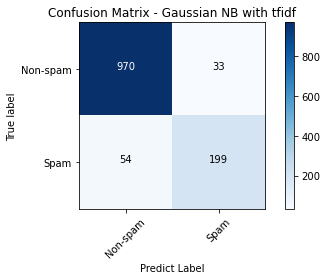

In [28]:
callPlotConfMatrix(clf_tfidf, x_test_features, cnf_matrix_gnb_tfidf,'Confusion Matrix - Gaussian NB with tfidf')

In [29]:
callPlotConfMatrix(clf,x_test_features_cv, cnf_matrix)

NameError: name 'cnf_matrix' is not defined

In [ ]:
callPlotConfMatrix(clf_LogReg_tfidf,x_test_features, cnf_matrix_logReg_tfidf,'Confusion Matrix -LOg Regress with tfidf')

In [ ]:
callPlotConfMatrix(clf_LogReg_cv,x_test_features_cv, cnf_matrix_logReg_CV,'Confusion Matrix -LOg Regress with CV')
# cnf_matrix_logReg_CV